# Text-to-Video generation with AnimateDiff and OpenVINO

AnimateDiff is a practical framework for animating personalized T2I models without requiring model-specific tuning. The core of animatediff framework is a plug-and-play motion module that can be trained once and seamlessly integrated into any personalized T2Is originating from the same base T2I. The motion module effectively learns transferable motion priors from real-world video, then can be inserted into a personalized T2I model to form a personalized animation generator. We further propose MotionLoRA, a lightweight fine-tuning technique for AnimateDiff that enables a pre-trained motion module to adapt to new motion patterns, such as different shot types, at a low training and data collection cost. Experiment results demonstrate that this approaches help these models generate temporally smooth animation clips while preserving the visual quality and motion diversity.


More details about model can be found in [model card](https://huggingface.co/stabilityai/stable-diffusion-3-medium), [research paper](https://arxiv.org/abs/2307.04725) and [Huggingface diffusers docs](https://huggingface.co/docs/diffusers/api/pipelines/animatediff).
In this tutorial, we will consider how to convert AnimateDiff for running with OpenVINO. 

#### Table of contents:

- [Prerequisites](#Prerequisites)
- [AnimateDiff Pipeline](#AnimateDiff-Pipeline)
    - [Build AnimateDiff PyTorch pipeline](#Build-AnimateDiff-PyTorch-pipeline)
    - [Convert AnimateDiff models with OpenVINO](#Convert-Animatediff-models-with-OpenVINO)
    - [Prepare OpenVINO AnimateDiff inference pipeline](#Prepare-OpenVINO-AnimateDiff-inference-pipeline)
    - [Run OpenVINO AnimateDiff pipeline](#Run-OpenVINO-AnimateDiff-model)

- [AnimateDiffLCM Pipeline](#AnimateDiffLCM-Pipeline)
    - [Build AnimateDiffLCM PyTorch pipeline](#Build-AnimateDiffLCM-PyTorch-pipeline)
    - [Convert AnimateDiffLCM models with OpenVINO](#Convert-AnimateDiffLCM-models-with-OpenVINO)
    - [Prepare OpenVINO AnimateDiffLCM inference pipeline](#Prepare-OpenVINO-AnimateDiffLCM-inference-pipeline)
    - [Run OpenVINO AnimateDiffLCM pipeline](#Run-OpenVINO-AnimateDiffLCM-model)


### Installation Instructions

This is a self-contained example that relies solely on its own code.

We recommend  running the notebook in a virtual environment. You only need a Jupyter server to start.
For details, please refer to [Installation Guide](https://github.com/openvinotoolkit/openvino_notebooks/blob/latest/README.md#-installation-guide).

<img referrerpolicy="no-referrer-when-downgrade" src="https://static.scarf.sh/a.png?x-pxid=5b5a4db0-7875-4bfb-bdbd-01698b5b1a77&file=notebooks/stable-diffusion-v3/stable-diffusion-v3.ipynb" />

In [1]:
## Prerequisites
%pip install -q "diffusers>=0.31" "torch>=2.1"  "transformers" "nncf>=2.12.0" "pillow" "peft>=0.7.0" "ipykernel" --extra-index-url https://download.pytorch.org/whl/cpu
%pip install -qU "openvino>=2024.6.0"


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import requests
from pathlib import Path

if not Path("animatediff_helper.py").exists():
    r = requests.get(url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/animatediff-text-to-video/animatediff_helper.py")
    open("animatediff_helper.py", "w").write(r.text)

AnimateDiff works with a MotionAdapter checkpoint and a Stable Diffusion model checkpoint. The MotionAdapter is a collection of Motion Modules that are responsible for adding coherent motion across image frames. These modules are applied after the Resnet and Attention blocks in Stable Diffusion UNet.

The following example demonstrates how to use a MotionAdapter checkpoint with Diffusers for inference based on StableDiffusion-1.5.

In [3]:
import torch

from diffusers import AnimateDiffPipeline, DDIMScheduler, MotionAdapter
from diffusers.utils import export_to_gif

from animatediff_helper import convert_animatediff, init_animatediff_pipeline
from animatediff_helper import MODEL_DIR, UNET_PATH, VAE_DECODER_PATH, TEXT_ENCODER_PATH

def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.


INFO:nncf:NNCF initialized successfully. Supported frameworks detected: torch, onnx, openvino


## Build AnimateDiff PyTorch pipeline

The following example demonstrates how to use a AnimatePipeline with LCM LoRA and Motion LoRA with Pytorch for inference based on StableDiffusion-1.5.

In [4]:
# Load the motion adapter
adapter = MotionAdapter.from_pretrained("guoyww/animatediff-motion-adapter-v1-5-2", trust_remote_code=True)
# load SD 1.5 based finetuned model
model_id = "SG161222/Realistic_Vision_V5.1_noVAE"
pipe = AnimateDiffPipeline.from_pretrained(model_id, motion_adapter=adapter, trust_remote_code=True)
scheduler = DDIMScheduler.from_pretrained(
    model_id,
    subfolder="scheduler",
    clip_sample=False,
    timestep_spacing="linspace",
    beta_schedule="linear",
    steps_offset=1,
)
pipe.scheduler = scheduler

output = pipe(
    prompt=(
        "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, "
        "orange sky, warm lighting, fishing boats, ocean waves seagulls, "
        "rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, "
        "golden hour, coastal landscape, seaside scenery"
    ),
    negative_prompt="bad quality, worse quality",
    num_frames=16,
    guidance_scale=7.5,
    num_inference_steps=25,
    generator=torch.Generator("cpu").manual_seed(42),
)
frames = output.frames[0]
export_to_gif(frames, "animation_pt.gif")

The config attributes {'motion_activation_fn': 'geglu', 'motion_attention_bias': False, 'motion_cross_attention_dim': None} were passed to MotionAdapter, but are not expected and will be ignored. Please verify your config.json configuration file.
Keyword arguments {'trust_remote_code': True} are not expected by AnimateDiffPipeline and will be ignored.
100%|██████████| 25/25 [10:54<00:00, 26.16s/it]


'animation_pt.gif'


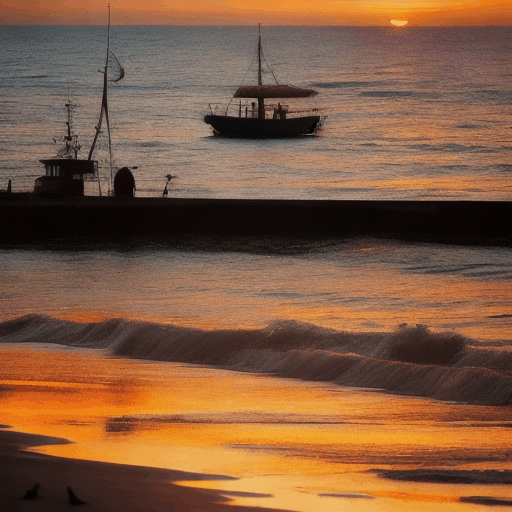

In [5]:
show_gif("animation_pt.gif")

## Convert AnimateDiff models with OpenVINO

In [8]:
# Convert AnimateDiff models with OpenVINO
use_lcm = False
device = "CPU"
global MODEL_DIR
global TEXT_ENCODER_PATH
global UNET_PATH
global VAE_DECODER_PATH

MODEL_DIR = Path("animatediff-ov")

TEXT_ENCODER_PATH = MODEL_DIR / "text_encoder.xml"
UNET_PATH = MODEL_DIR / "unet.xml"
VAE_DECODER_PATH = MODEL_DIR / "vae_decoder.xml"

model_id="SG161222/Realistic_Vision_V5.1_noVAE"
motion_adapter_path="guoyww/animatediff-motion-adapter-v1-5-2"
convert_animatediff(model_id, motion_adapter_path, use_lcm=use_lcm)

The config attributes {'motion_activation_fn': 'geglu', 'motion_attention_bias': False, 'motion_cross_attention_dim': None} were passed to MotionAdapter, but are not expected and will be ignored. Please verify your config.json configuration file.
Keyword arguments {'trust_remote_code': True} are not expected by AnimateDiffPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 5/5 [00:00<00:00, 10.77it/s]


*** T5 encoder model conversion started ***


/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/transformers/modeling_utils.py:5055: FutureWarning: `_is_quantized_training_enabled` is going to be deprecated in transformers 4.39.0. Please use `model.hf_quantizer.is_trainable` instead
  warnings.warn(
`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/transformers/modeling_attn_mask_utils.py:88: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if input_shape[-1] > 1 or self.sliding_window is not None:
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/transformers/modeling_attn_mask_utils.py:164: TracerWarning: Converting a tensor to a Python bool

*** T5 encoder conversion finished ***
*** VAE decoder conversion started ***


/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/upsampling.py:147: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert hidden_states.shape[1] == self.channels
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/upsampling.py:162: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if hidden_states.shape[0] >= 64:
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/upsampling.py:173: TracerWarning: Converting a tensor to a Python boolean m

*** VAE decoder conversion end ***
*** Unet model conversion started ***


/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/unets/unet_motion_model.py:2102: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if any(s % default_overall_up_factor != 0 for s in sample.shape[-2:]):
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/downsampling.py:136: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert hidden_states.shape[1] == self.channels
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/downsampling.py:145: 

## Prepare OpenVINO AnimateDiff inference pipeline

In [7]:
# Prepare OpenVINO AnimateDiff inference pipeline
models_dict = {
        "unet": UNET_PATH,
        "vae": VAE_DECODER_PATH,
        "text_encoder": TEXT_ENCODER_PATH,
}
ov_pipe = init_animatediff_pipeline(models_dict, device=device, use_lcm=use_lcm)

Models compilation
unet - Done!
vae - Done!
text_encoder - Done!


## Run OpenVINO AnimateDiff pipeline
The following example demonstrates how to use a AnimatePipeline with Motion LoRA with OpenVINO for inference based on StableDiffusion-1.5.

In [8]:
# Run OpenVINO AnimateDiff pipeline
output = ov_pipe(
    prompt=(
        "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, "
        "orange sky, warm lighting, fishing boats, ocean waves seagulls, "
        "rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, "
        "golden hour, coastal landscape, seaside scenery"
    ),
    negative_prompt="bad quality, worse quality",
    num_frames=16,
    height=512,
    width=512,
    guidance_scale=1.5 if use_lcm else 7.5,
    num_inference_steps=6 if use_lcm else 25,
    generator=torch.Generator("cpu").manual_seed(42),
)
frames = output.frames[0]
export_to_gif(frames, "animation_ov.gif")

100%|██████████| 25/25 [07:34<00:00, 18.17s/it]


[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]


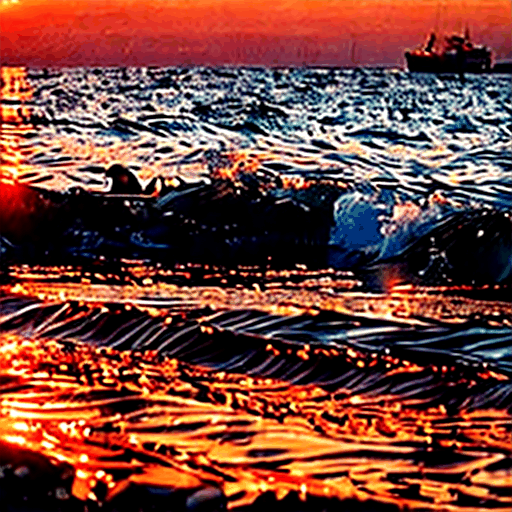

In [ ]:
show_gif("animation_ov.gif")

## Build AnimateDiffLCM PyTorch pipeline

AnimateLCM is a motion module checkpoint and an LCM LoRA that have been created using a consistency learning strategy that decouples the distillation of the image generation priors and the motion generation priors. AnimateLCM is also compatible with existing Motion LoRAs.

The following example demonstrates how to use a AnimatePipeline with LCM LoRA and Motion LoRA with Pytorch for inference based on StableDiffusion-1.5.

In [17]:
import torch
from diffusers import AnimateDiffPipeline, LCMScheduler, MotionAdapter
from diffusers.utils import export_to_gif

adapter = MotionAdapter.from_pretrained("wangfuyun/AnimateLCM")
pipe = AnimateDiffPipeline.from_pretrained("emilianJR/epiCRealism", motion_adapter=adapter)
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config, beta_schedule="linear")

pipe.load_lora_weights("wangfuyun/AnimateLCM", weight_name="AnimateLCM_sd15_t2v_lora.safetensors", adapter_name="lcm-lora")
pipe.load_lora_weights("guoyww/animatediff-motion-lora-tilt-up", adapter_name="tilt-up")

pipe.set_adapters(["lcm-lora", "tilt-up"], [1.0, 0.8])

output = pipe(
    prompt="A space rocket with trails of smoke behind it launching into space from the desert, 4k, high resolution",
    negative_prompt="bad quality, worse quality, low resolution",
    num_frames=16,
    guidance_scale=1.5,
    num_inference_steps=6,
    generator=torch.Generator("cpu").manual_seed(0),
)
frames = output.frames[0]
export_to_gif(frames, "animatelcm-motion-pytorch-lora.gif")

100%|██████████| 6/6 [03:33<00:00, 35.51s/it]


'animatelcm-motion-pytorch-lora.gif'


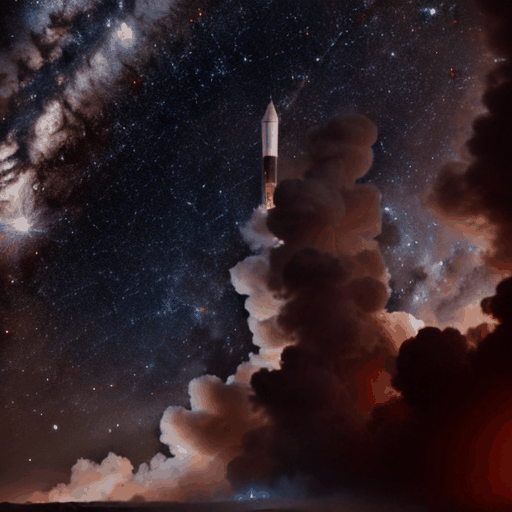

In [18]:
show_gif("animatelcm-motion-pytorch-lora.gif")

## Convert AnimateDiffLCM models with OpenVINO

In [19]:
## Convert AnimateDiffLCM models with OpenVINO

use_lcm = True
device = "CPU"
model_id="emilianJR/epiCRealism"
motion_adapter_path="guoyww/animatediff-motion-lora-tilt-up"
lora_adapter_path="wangfuyun/AnimateLCM"

global MODEL_DIR
global TEXT_ENCODER_PATH
global UNET_PATH
global VAE_DECODER_PATH

MODEL_DIR = Path("animatediff-lcm-ov")
TEXT_ENCODER_PATH = MODEL_DIR / "text_encoder.xml"
UNET_PATH = MODEL_DIR / "unet.xml"
VAE_DECODER_PATH = MODEL_DIR / "vae_decoder.xml"

convert_animatediff(model_id, motion_adapter_path, lora_adapter_path, use_lcm=use_lcm)

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  9.40it/s]


*** T5 encoder model conversion started ***


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/transformers/modeling_utils.py:5055: FutureWarning: `_is_quantized_training_enabled` is going to be deprecated in transformers 4.39.0. Please use `model.hf_quantizer.is_trainable` instead
  warnings.warn(
`loss_type=None` was set in the config but it is unrecognised.Using the d

*** T5 encoder conversion finished ***
*** VAE decoder conversion started ***


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/upsampling.py:147: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not gener

*** VAE decoder conversion end ***
*** Unet model conversion started ***


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/home/openvino/anaconda3/envs/openvino.genai/lib/python3.10/site-packages/diffusers/models/unets/unet_motion_model.py:2102: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace m

*** Unet model conversion finished ***


## Prepare OpenVINO AnimateDiffLCM inference pipeline

In [24]:
# Prepare OpenVINO AnimateDiffLCM inference pipeline
models_dict = {
        "unet": UNET_PATH,
        "vae": VAE_DECODER_PATH,
        "text_encoder": TEXT_ENCODER_PATH,
}
print("MODEL_DIR: ", MODEL_DIR)
print("models_dict: ", models_dict)
ov_pipe = init_animatediff_pipeline(models_dict, device=device, use_lcm=use_lcm)

MODEL_DIR:  animatediff-lcm-ov
models_dict:  {'unet': PosixPath('animatediff-lcm-ov/unet.xml'), 'vae': PosixPath('animatediff-lcm-ov/vae_decoder.xml'), 'text_encoder': PosixPath('animatediff-lcm-ov/text_encoder.xml')}
Models compilation
unet - Done!
vae - Done!
text_encoder - Done!


SSLError: (MaxRetryError("HTTPSConnectionPool(host='huggingface.co', port=443): Max retries exceeded with url: /animatediff-ov/tokenizer/resolve/main/tokenizer_config.json (Caused by SSLError(SSLEOFError(8, '[SSL: UNEXPECTED_EOF_WHILE_READING] EOF occurred in violation of protocol (_ssl.c:1007)')))"), '(Request ID: 33c7d880-1e39-49ca-98d8-8ea8cb9249ed)')

## Run OpenVINO AnimateDiffLCM pipeline

In [ ]:
output = ov_pipe(
    prompt=(
        "masterpiece, bestquality, highlydetailed, ultradetailed, sunset, "
        "orange sky, warm lighting, fishing boats, ocean waves seagulls, "
        "rippling water, wharf, silhouette, serene atmosphere, dusk, evening glow, "
        "golden hour, coastal landscape, seaside scenery"
    ),
    negative_prompt="bad quality, worse quality",
    num_frames=16,
    height=512,
    width=512,
    guidance_scale=1.5 if use_lcm else 7.5,
    num_inference_steps=6 if use_lcm else 25,
    generator=torch.Generator("cpu").manual_seed(42),
)
frames = output.frames[0]
export_to_gif(frames, "animation_lcm_ov.gif")

In [ ]:
show_gif("animation_lcm_ov.gif")